# Customer Segmentation for a Vehicle Insurance Company
## —— Identifying and predicting customer profiles using supervised and unsupervised machine learning

<br>

## Part II: Data Exploration, Modelling and Evaluation

<h2 style="background-color:DodgerBlue;color:white"> 1. Setting up the Work Environment

In [171]:
# 1. Importing the necessary packages
# 1.1 Data Manipulation and Computations
import pandas as pd
import numpy as np

# 1.2 Visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# 1.3 Importing the data from Kaggle (uncomment if haven't downloaded the data set)
# import kaggle
# import zipfile

In [209]:
# 2. Setting up the notebook environment
# 2.1 Display
pd.set_option('display.precision', 2)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
from IPython.core.interactiveshell import InteractiveShell  
InteractiveShell.ast_node_interactivity = "all"

# 2.2 Visuals
sns.set_theme(context = 'notebook', palette = 'coolwarm', style = 'white')

In [195]:
# 3. Machine Learning tools
# 3.1 Data preparation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import PowerTransformer

# 3.2 Machine Learning Modelling
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import pycaret.classification as pyclass
import pycaret.clustering as pyclst
import pycaret.regression as pyreg

# 3.3 Hierachical Clustering
from scipy.cluster.hierarchy import dendrogram, linkage
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering

# 3.4 Model Evaluation
from sklearn.metrics import confusion_matrix, classification_report

<h2 style="background-color:DodgerBlue;color:white">2. Importing the Data Set

In [ ]:
# Downloading the data file directly from Kaggle (uncomment if haven't downloaded the data set)
#!kaggle datasets download -d lakshmanraj/vehicle-insurance-policy

# Extracting the files from zip
# with zipfile.ZipFile("vehicle-insurance-policy.zip","r") as zip_file:
#    zip_file.extractall()

In [6]:
df = pd.read_csv(r'C:\Users\mding\Desktop\Vehicle_policies_2020.csv')

# Getting an idea of what the data looks like
df.head()

,pol_number,pol_eff_dt,gender,agecat,date_of_birth,credit_score,area,traffic_index,veh_age,veh_body,veh_value,claim_office,numclaims,claimcst0,annual_premium
0,43124327,12/30/2020,F,4.00,7/12/1968,381.00,D,133.60,2,HBACK,1.33,NaN,0,0.00,716.53
1,21919609,12/30/2020,F,2.00,11/5/1982,549.00,D,163.60,1,UTE,3.74,NaN,0,0.00,716.53
2,72577057,12/30/2020,M,2.00,11/26/1983,649.00,B,117.50,4,COUPE,0.88,NaN,0,0.00,716.53
3,92175225,12/30/2020,M,4.00,11/2/1960,743.00,B,100.70,3,SEDAN,1.04,NaN,0,0.00,716.53
4,66223239,12/30/2020,F,4.00,1/4/1968,817.00,C,115.50,4,HBACK,0.47,NaN,0,0.00,716.53


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60392 entries, 0 to 60391
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   pol_number      60392 non-null  int64  
 1   pol_eff_dt      60392 non-null  object 
 2   gender          60392 non-null  object 
 3   agecat          55561 non-null  float64
 4   date_of_birth   60392 non-null  object 
 5   credit_score    57591 non-null  float64
 6   area            60392 non-null  object 
 7   traffic_index   56889 non-null  float64
 8   veh_age         60392 non-null  int64  
 9   veh_body        60392 non-null  object 
 10  veh_value       60392 non-null  float64
 11  claim_office    10030 non-null  object 
 12  numclaims       60392 non-null  int64  
 13  claimcst0       60392 non-null  float64
 14  annual_premium  60392 non-null  float64
dtypes: float64(6), int64(3), object(6)
memory usage: 6.9+ MB


In [7]:
df.describe(include = 'all')

,pol_number,pol_eff_dt,gender,agecat,date_of_birth,credit_score,area,traffic_index,veh_age,veh_body,veh_value,claim_office,numclaims,claimcst0,annual_premium
count,60392.00,60392,60392,55561.00,60392,57591.00,60392,56889.00,60392.00,60392,60392.00,10030,60392.00,60392.00,60392.00
unique,NaN,364,2,NaN,20844,NaN,6,NaN,NaN,13,NaN,4,NaN,NaN,NaN
top,NaN,1/29/2020,F,NaN,4/16/1985,NaN,C,NaN,NaN,SEDAN,NaN,B,NaN,NaN,NaN
freq,NaN,204,34316,NaN,14,NaN,18236,NaN,NaN,19798,NaN,4038,NaN,NaN,NaN
mean,54992042.97,NaN,NaN,3.49,NaN,662.19,NaN,103.89,2.67,NaN,1.96,NaN,0.21,644.88,716.53
std,25870034.66,NaN,NaN,1.43,NaN,136.45,NaN,33.69,1.07,NaN,1.33,NaN,0.55,3354.63,0.00
min,10000396.00,NaN,NaN,1.00,NaN,301.00,NaN,0.00,1.00,NaN,0.00,NaN,0.00,0.00,716.53
25%,32804730.50,NaN,NaN,2.00,NaN,602.00,NaN,80.30,2.00,NaN,1.11,NaN,0.00,0.00,716.53
50%,55001798.50,NaN,NaN,3.00,NaN,682.00,NaN,108.30,3.00,NaN,1.65,NaN,0.00,0.00,716.53
75%,77296135.00,NaN,NaN,5.00,NaN,772.00,NaN,132.00,4.00,NaN,2.37,NaN,0.00,0.00,716.53


Based on the previous outputs, we can make a few important observations:
1. 'annual_premium' has a variance of 0.
2. 'claim_office' seem to contain a lot of missing values.
3. 'pol_number' and 'pol_eff_dt' don't seem useful for our analysis.
4. 'date_of_birth' can be converted 'age' to make it easier to work it.

In [8]:
# Let's see how much data is actually missing in the claim_office column
missing_claim_office = df.claim_office.isnull().sum()
print(f"claim_office is missing {round(missing_claim_office/df.shape[0]*100,2)}% data")

claim_office is missing 83.39% data


In [7]:
# Let's extract age from the date_of_birth column
df['age'] = 2020 - pd.DatetimeIndex(df['date_of_birth']).year
df.head()

,pol_number,pol_eff_dt,gender,agecat,date_of_birth,credit_score,area,traffic_index,veh_age,veh_body,veh_value,claim_office,numclaims,claimcst0,annual_premium,age
0,43124327,12/30/2020,F,4.00,7/12/1968,381.00,D,133.60,2,HBACK,1.33,NaN,0,0.00,716.53,52
1,21919609,12/30/2020,F,2.00,11/5/1982,549.00,D,163.60,1,UTE,3.74,NaN,0,0.00,716.53,38
2,72577057,12/30/2020,M,2.00,11/26/1983,649.00,B,117.50,4,COUPE,0.88,NaN,0,0.00,716.53,37
3,92175225,12/30/2020,M,4.00,11/2/1960,743.00,B,100.70,3,SEDAN,1.04,NaN,0,0.00,716.53,60
4,66223239,12/30/2020,F,4.00,1/4/1968,817.00,C,115.50,4,HBACK,0.47,NaN,0,0.00,716.53,52


In [8]:
# Claim_office is missing too much data, and it is not extremely useful for our purpose, so we will drop it.
# pol_number and pol_eff_dt are also not useful; annual_premium has no variance, so we will drop these as well.
df = df.drop(['claim_office', 'pol_number', 'pol_eff_dt', 'annual_premium', 'date_of_birth'], axis = 1)
df.head()

,gender,agecat,credit_score,area,traffic_index,veh_age,veh_body,veh_value,numclaims,claimcst0,age
0,F,4.00,381.00,D,133.60,2,HBACK,1.33,0,0.00,52
1,F,2.00,549.00,D,163.60,1,UTE,3.74,0,0.00,38
2,M,2.00,649.00,B,117.50,4,COUPE,0.88,0,0.00,37
3,M,4.00,743.00,B,100.70,3,SEDAN,1.04,0,0.00,60
4,F,4.00,817.00,C,115.50,4,HBACK,0.47,0,0.00,52


In [9]:
# splitting into train and test before further exploration to avoid data leakage
# let's use a final test size of 10%
test_size = 0.1

testdf = df.sample(int(df.shape[0] * test_size), random_state = 42)
traindf = df.drop(testdf.index, axis = 0)
print(f"The training set has a shape of {traindf.shape}, and the test set has a shape of {testdf.shape}")

The training set has a shape of (54353, 11), and the test set has a shape of (6039, 11)


<h2 style="background-color:DodgerBlue;color:white">3. Exploratory Data Analysis (EDA)

**EDA serves two main purposes:**
1. Checking data quality: What aspects of the data require cleaning?
- Missing values
- Mis-entries
- Outliers
- Wrong data types
- etc...
2. Exploring feature characteristics: Which features need to be engineered? Can we create more informative features?
- Data scales
- Correlations
- Rare/imbalanced categorical classes
- Low variance features
- Discretizable numerical features
- etc...

### 3.1 Data Quality Exploration

#### 3.1.1 Data Types

In [80]:
# checking to see if data has the correct data types
traindf.info()
# gender, agecat, area, veh_body should be categorical
# credit_score, age, traffic_index, veh_age, veh_value, numclaims and claimcst0 are correct as numerical

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54353 entries, 0 to 60391
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gender         54353 non-null  object 
 1   agecat         50006 non-null  float64
 2   credit_score   51837 non-null  float64
 3   area           54353 non-null  object 
 4   traffic_index  51219 non-null  float64
 5   veh_age        54353 non-null  int64  
 6   veh_body       54353 non-null  object 
 7   veh_value      54353 non-null  float64
 8   numclaims      54353 non-null  int64  
 9   claimcst0      54353 non-null  float64
 10  age            54353 non-null  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 5.0+ MB


In [83]:
# fix the types now so easier to do exploration later on
categorical_features = ['gender', 'agecat', 'area', 'veh_body']

traindf[categorical_features] = traindf[categorical_features].astype('category')
testdf[categorical_features] = testdf[categorical_features].astype('category')

traindf.info()
# We can see that by converting object into category, our memory
# usage has significantly improved as well.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54353 entries, 0 to 60391
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   gender         54353 non-null  category
 1   agecat         50006 non-null  category
 2   credit_score   51837 non-null  float64 
 3   area           54353 non-null  category
 4   traffic_index  51219 non-null  float64 
 5   veh_age        54353 non-null  int64   
 6   veh_body       54353 non-null  category
 7   veh_value      54353 non-null  float64 
 8   numclaims      54353 non-null  int64   
 9   claimcst0      54353 non-null  float64 
 10  age            54353 non-null  int64   
dtypes: category(4), float64(4), int64(3)
memory usage: 3.5 MB


#### 3.1.2 Missing Values
We can see that there are missing values in 'agecat', 'credit_score', 'traffic_index' columns. Based on the distribution of these missing values, it seems that they are missing at random.

On closer inspection of the data description, agecat is based on age, and traffic_index is based on area, so we might be able to impute the missing values there.

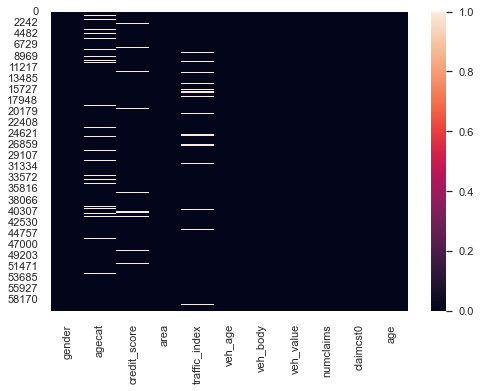

In [173]:
sns.heatmap(traindf.isnull()); 

#### 3.1.3 Data Distribution and Outliers

- We can see that none of the numerical columns have a normal distribution. They are all skewed to some extent.
- 'veh_value' and 'claimcst0' seem to contain a lot of outliers, and it makes sense. Most cars are around the same price, but there are a very very expensive cars. Most people don't make an insurnace claim, but there are a few that makes huge claim amounts.

The numerical features are Index(['credit_score', 'traffic_index', 'veh_age', 'veh_value', 'numclaims',
       'claimcst0', 'age'],
      dtype='object')


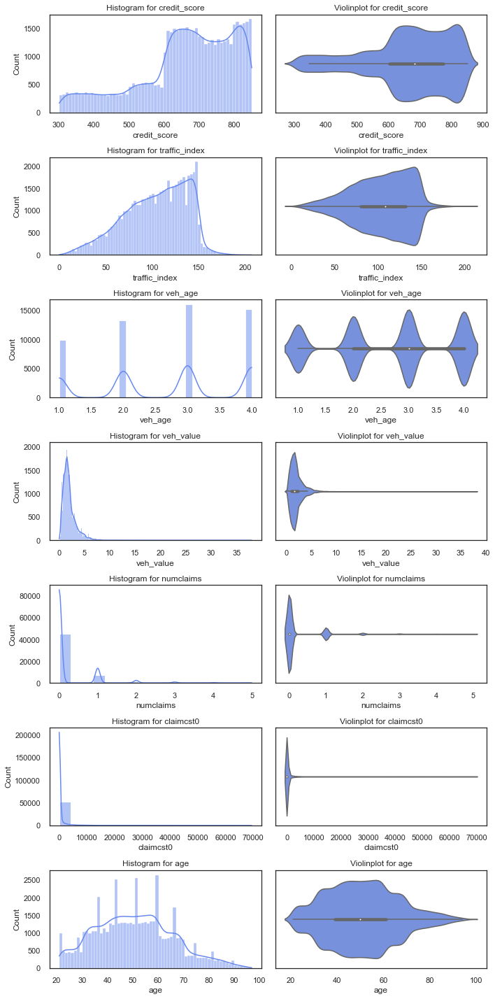

In [84]:
# exploring the distribution of numerical variables
num_feats = traindf.select_dtypes(include = 'number')
print(f"The numerical features are {num_feats.columns}")

# histogram and violinplot
fig = plt.figure(figsize = (10, 20))
i = 1

for feat in num_feats:
    fig.add_subplot(7,2,i)
    ax1 = sns.histplot(traindf[feat], kde = True)
    plt.title(f'Histogram for {feat}')
    i += 1
    fig.add_subplot(7,2,i)
    ax2 = sns.violinplot(traindf[feat])
    plt.title(f'Violinplot for {feat}')
    i += 1

plt.tight_layout()
plt.show();

### 3.2 Feature Characteristic Exploration

#### 3.2.1 Feature Scales
- Based on the previous histograms and violin plots, we can see that some of the features are on very different scales. For example 'age' is between 20-100, while 'claimcst0' is between 0-70000.

#### 3.2.2 Feature Rare/Minority Classes
- We can see that 'veh_body' contains many rare labels that don't even show a bar in the countplot. We can use some domain knowledge to group similar rare labels together, for example roadster cars and coupes may be considered as a similar class.

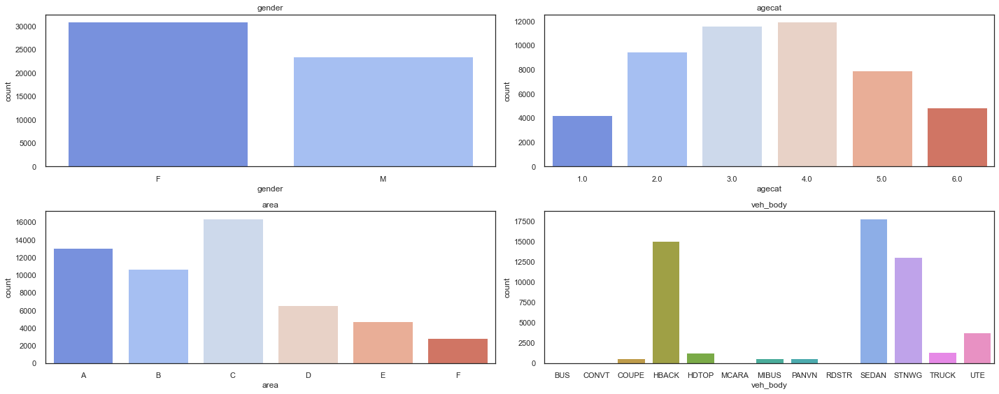

In [51]:
# checking categorical variables
fig = plt.figure(figsize = (20,8))
i = 1

for feat in categorical_features:
    fig.add_subplot(2,2,i)
    ax = sns.countplot(data = traindf, x = feat)
    i += 1
    ax.set_title(feat)
    
plt.tight_layout();

#### 3.2.3 Correlation
- We can see that 'veh_value' and 'veh_age' are moderately negatively correlated, which is expected.
- ‘claimscst0’ and ‘numclaims’ are moderately positively correlated, which also makes sense.

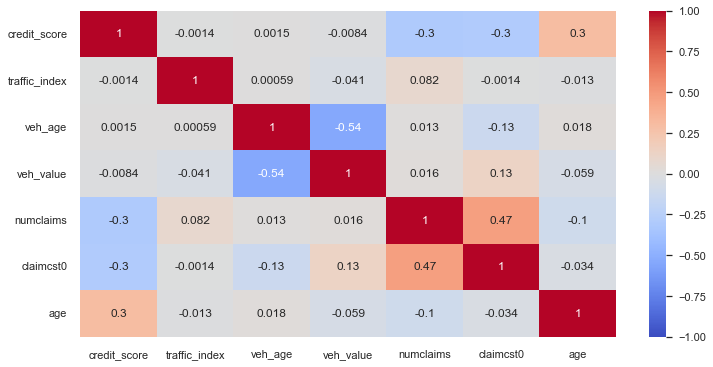

In [85]:
# exploring relationships between features (bivariate)
fig = plt.figure(figsize = (12,6))
sns.heatmap(traindf.corr(), vmin=-1, vmax=1, annot = True, cmap = 'coolwarm');

#### Feature relationship with potential 'target' variable
- Our potential target variables are 'numclaims' and 'claimcst0' since they indicate the riskiness of a customer
- From the plots below, we can confirm that our data indeed contain a lot of outliers, where most people don't make a claim, and there are some people who make a lot of claims.

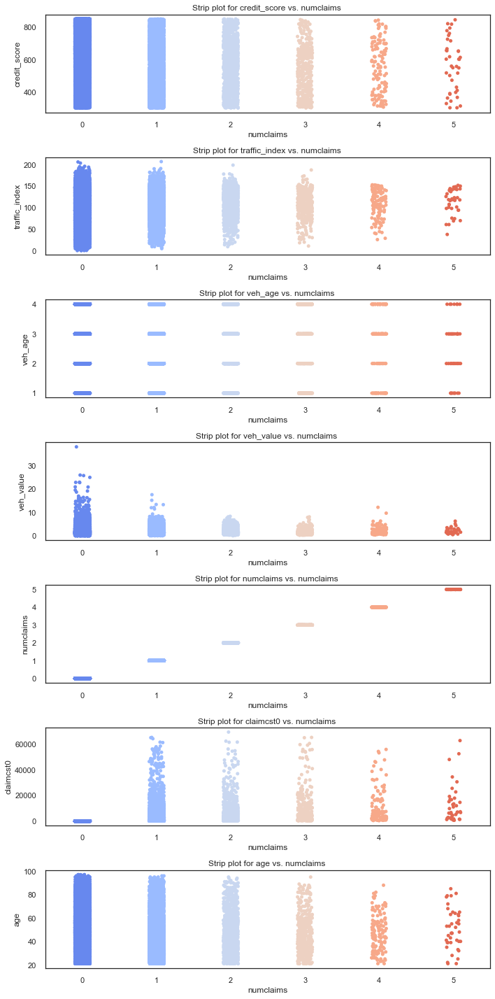

In [86]:
# numclaims vs numericals
fig = plt.figure(figsize = (10, 20))
i = 1

for feat in num_feats:
    fig.add_subplot(7,1,i)
    ax1 = sns.stripplot(data = traindf, x ='numclaims', y = feat)
    plt.title(f'Strip plot for {feat} vs. numclaims ')
    i += 1

plt.tight_layout();

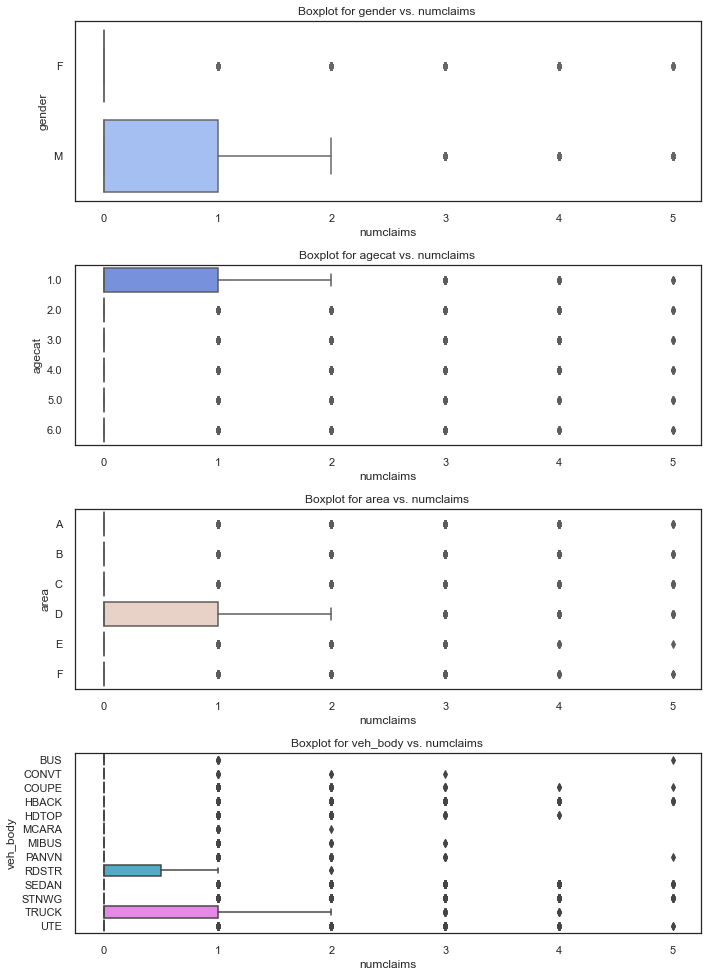

In [66]:
# numclaims vs categoricals
fig = plt.figure(figsize = (10, 20))
i = 1

for feat in categorical_features:
    fig.add_subplot(6,1,i)
    ax1 = sns.boxplot(data = traindf, x ='numclaims', y = feat)
    plt.title(f'Boxplot for {feat} vs. numclaims ')
    i += 1

plt.tight_layout();

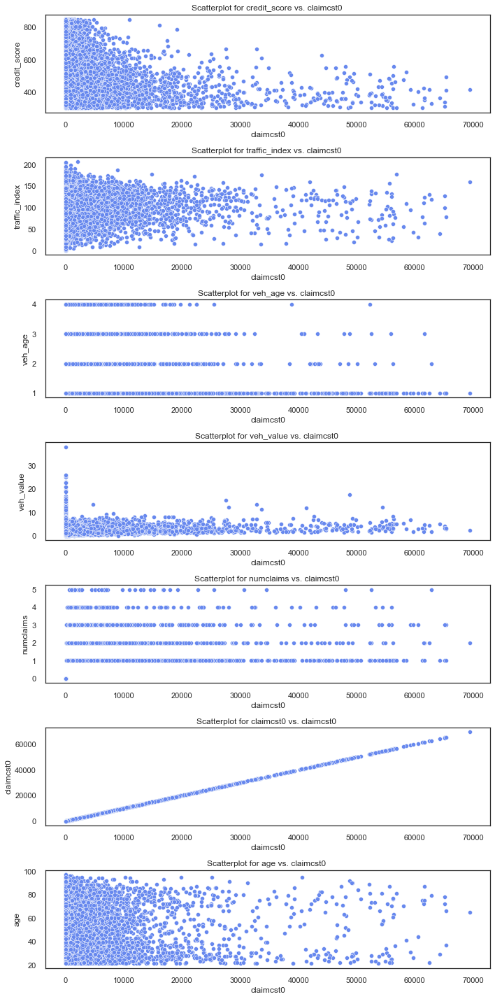

In [87]:
# claimcst0 vs numericals
fig = plt.figure(figsize = (10, 20))
i = 1

for feat in num_feats:
    fig.add_subplot(7,1,i)
    ax1 = sns.scatterplot(data = traindf, x ='claimcst0', y = feat)
    plt.title(f'Scatterplot for {feat} vs. claimcst0 ')
    i += 1

plt.tight_layout();

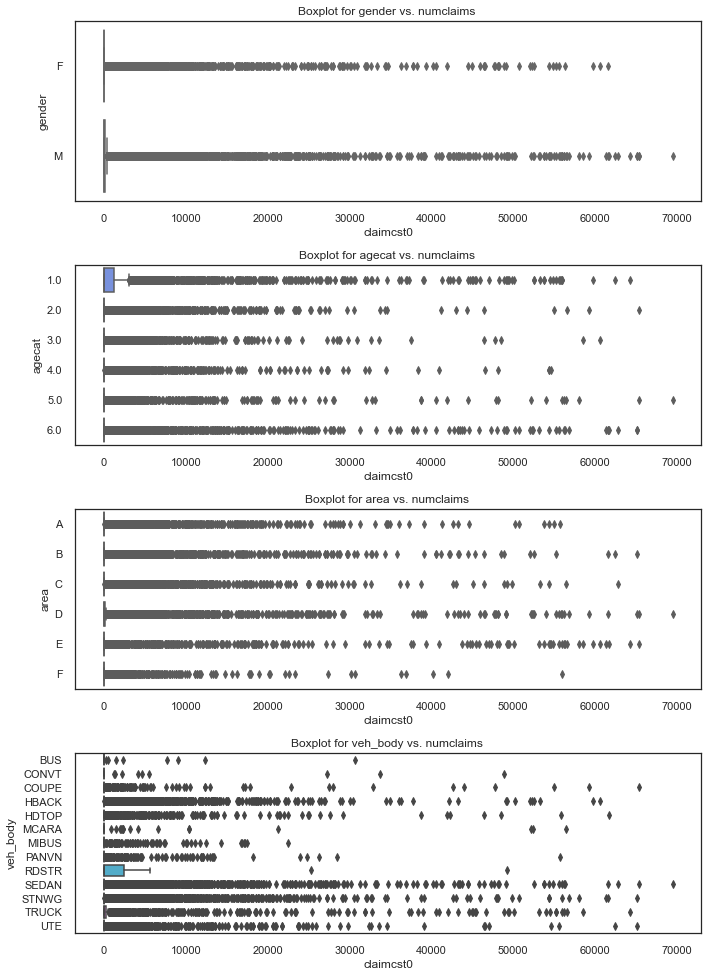

In [71]:
# claimcst0 vs categoricals
fig = plt.figure(figsize = (10, 20))
i = 1

for feat in categorical_features:
    fig.add_subplot(6,1,i)
    ax1 = sns.boxplot(data = traindf, x ='claimcst0', y = feat)
    plt.title(f'Boxplot for {feat} vs. numclaims ')
    i += 1

plt.tight_layout();

In [88]:
traindf[traindf.claimcst0 == 0]
# We can see that 45k people did not make a single claim

,gender,agecat,credit_score,area,traffic_index,veh_age,veh_body,veh_value,numclaims,claimcst0,age
0,F,4.00,381.00,D,133.60,2,HBACK,1.33,0,0.00,52
1,F,2.00,549.00,D,163.60,1,UTE,3.74,0,0.00,38
2,M,2.00,649.00,B,117.50,4,COUPE,0.88,0,0.00,37
3,M,4.00,743.00,B,100.70,3,SEDAN,1.04,0,0.00,60
5,F,4.00,741.00,B,153.20,4,MIBUS,1.66,0,0.00,54
...,...,...,...,...,...,...,...,...,...,...,...
60387,F,5.00,809.00,C,145.50,4,HBACK,0.89,0,0.00,64
60388,M,4.00,681.00,D,86.30,1,HBACK,1.88,0,0.00,59
60389,M,4.00,773.00,F,110.00,1,STNWG,5.17,0,0.00,55
60390,M,3.00,714.00,B,NaN,1,HBACK,1.90,0,0.00,42


In [174]:
traindf[(traindf.claimcst0 <= 716.53) & (traindf.claimcst0 >0)]
# 3.1k people made claims below the premium they paid

,gender,agecat,credit_score,area,traffic_index,veh_age,veh_body,veh_value,numclaims,claimcst0,age
49,M,6.00,823.00,D,107.10,3,HBACK,0.85,1,545.06,77
74,M,5.00,842.00,C,108.00,2,STNWG,4.89,1,469.90,65
78,M,2.00,524.00,C,147.00,4,UTE,1.58,1,346.43,40
102,M,3.00,683.00,A,77.60,4,HBACK,0.81,1,417.85,43
120,F,3.00,646.00,A,79.30,2,SEDAN,1.57,1,474.71,48
...,...,...,...,...,...,...,...,...,...,...,...
60322,F,3.00,656.00,F,116.00,4,STNWG,1.79,1,164.16,47
60348,M,6.00,637.00,B,109.00,2,HBACK,1.28,1,467.64,87
60357,F,3.00,NaN,B,104.20,4,SEDAN,1.16,1,408.36,43
60372,M,4.00,582.00,C,132.00,4,SEDAN,0.39,1,490.90,52


In [175]:
traindf[(traindf.claimcst0 > 716.53)]
# around 6k people make claims above the premium of $716.53.

,gender,agecat,credit_score,area,traffic_index,veh_age,veh_body,veh_value,numclaims,claimcst0,age
15,M,5.00,584.00,C,105.00,3,SEDAN,1.53,1,1120.83,63
18,M,3.00,396.00,E,25.50,4,UTE,1.65,2,4548.08,43
25,M,2.00,NaN,D,88.20,3,TRUCK,3.34,1,4657.07,35
28,F,4.00,347.00,B,136.30,3,SEDAN,1.62,1,2265.26,55
30,F,2.00,431.00,C,111.00,1,HBACK,2.42,3,6616.97,40
...,...,...,...,...,...,...,...,...,...,...,...
60328,M,1.00,376.00,C,133.50,1,HBACK,2.97,4,53247.73,23
60340,F,NaN,536.00,D,104.10,3,HBACK,0.89,1,884.48,33
60341,M,1.00,441.00,A,73.60,1,HBACK,1.73,1,14289.31,26
60349,M,4.00,443.00,C,106.50,4,HBACK,0.94,1,804.43,52


**Ideally then, our model should identify low risk customers who tend to make low claims (0 or significantly below their premium), medium risk customers who make claims around the current premium, and high risk customers whose average claims are far above the current premium.**

<h2 style="background-color:DodgerBlue;color:white">4. Data Cleaning and Preparation

### 4.1 Finding rules for imputing missing values

In [93]:
# finding the rule for age and agecat
traindf.groupby('agecat')['age'].describe()
# clearly age<30 = agecat 1 ... age > 71 and < 100 = agecat 6

,count,mean,std,min,25%,50%,75%,max
agecat,,,,,,,,
1.0,4235.00,25.45,2.90,21.00,23.00,25.00,28.00,30.00
2.0,9451.00,35.53,2.88,31.00,33.00,36.00,38.00,40.00
3.0,11611.00,45.53,2.86,41.00,43.00,46.00,48.00,50.00
4.0,11951.00,55.55,2.87,51.00,53.00,56.00,58.00,60.00
5.0,7916.00,65.46,2.86,61.00,63.00,65.00,68.00,70.00
6.0,4842.00,79.38,6.12,71.00,74.00,78.00,84.00,97.00


In [94]:
# finding the rule for traffic index
traindf.groupby('area')['traffic_index'].describe()
# by looking at the mean and median, we see that the traffic_index for each area is relatively normally distributed, so let's impute missing
# with the mean according to each area

,count,mean,std,min,25%,50%,75%,max
area,,,,,,,,
A,12403.00,80.25,20.07,6.70,66.50,80.20,93.90,165.60
B,9839.00,120.17,20.23,30.20,106.65,120.00,133.90,198.80
C,15621.00,128.48,18.46,30.00,118.50,133.50,142.50,150.00
D,6522.00,99.16,29.67,0.00,79.60,99.20,119.07,207.00
E,4298.00,45.07,20.53,1.50,30.00,43.50,58.50,133.50
F,2536.00,115.26,27.57,26.00,96.00,116.00,134.00,192.00


### 4.2 Defining a function for preparing data for train and test sets

In [10]:
def data_cleaner(traindf, data_to_impute):
    '''
    imputes missing values for agecat and traffic_index based on training data
    drops the remaining missing values for credit_score
    group rare vehicle body class labels
    returns cleaned data
    '''
    # 1. Imputing agecat
    age_groups = traindf.groupby('agecat')['age'].max()
    
    c1 = (data_to_impute.age <= age_groups[1.0])
    c2 = (data_to_impute.age <= age_groups[2.0]) & (data_to_impute.age > age_groups[1.0])
    c3 = (data_to_impute.age <= age_groups[3.0]) & (data_to_impute.age > age_groups[2.0])
    c4 = (data_to_impute.age <= age_groups[4.0]) & (data_to_impute.age > age_groups[3.0])
    c5 = (data_to_impute.age <= age_groups[5.0]) & (data_to_impute.age > age_groups[4.0])
    
    data_to_impute['agecat'] = np.select([c1,c2,c3,c4,c5], [1,2,3,4,5], default = 6) # else agecat = 6
    
    # 2. Imputing traffic_index
    trf = traindf.groupby('area')['traffic_index'].median()
    
    a1 = (data_to_impute.area == 'A') & (data_to_impute.traffic_index.isnull())
    a2 = (data_to_impute.area == 'B') & (data_to_impute.traffic_index.isnull())
    a3 = (data_to_impute.area == 'C') & (data_to_impute.traffic_index.isnull())
    a4 = (data_to_impute.area == 'D') & (data_to_impute.traffic_index.isnull())
    a5 = (data_to_impute.area == 'E') & (data_to_impute.traffic_index.isnull())
    a6 = (data_to_impute.area == 'F') & (data_to_impute.traffic_index.isnull())
    
    conditions = [a1,a2,a3,a4,a5,a6]
    idx = range(0,6)
    
    for cond, id in zip(conditions, idx):
        data_to_impute['traffic_index'] = np.where(cond, id, data_to_impute.traffic_index)
        
    # 3. dropping missing rows from credit_score
    data_to_impute.dropna(inplace = True)
    
    # 4. grouping rare classes in the veh_body feature
    body_dict = {'UTE':'UTE/VAN', 'PANVN':'UTE/VAN',
             'CONVT':'SPORTS', 'RDSTR':'SPORTS','HDTOP':'SPORTS', 'COUPE':'SPORTS',
             'BUS':'LARGE','MIBUS':'LARGE','TRUCK':'LARGE','MCARA':'LARGE'}
    
    data_to_impute.replace(body_dict, inplace = True)
    
    return data_to_impute

### 4.3 Verfiying data cleaning worked as expected

In [11]:
clean_traindf = traindf.copy()

clean_traindf = data_cleaner(traindf, clean_traindf)
clean_traindf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51837 entries, 0 to 60390
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gender         51837 non-null  object 
 1   agecat         51837 non-null  int32  
 2   credit_score   51837 non-null  float64
 3   area           51837 non-null  object 
 4   traffic_index  51837 non-null  float64
 5   veh_age        51837 non-null  int64  
 6   veh_body       51837 non-null  object 
 7   veh_value      51837 non-null  float64
 8   numclaims      51837 non-null  int64  
 9   claimcst0      51837 non-null  float64
 10  age            51837 non-null  int64  
dtypes: float64(4), int32(1), int64(3), object(3)
memory usage: 4.5+ MB


In [264]:
clean_traindf.veh_body.value_counts(normalize = True)

SEDAN     0.33
HBACK     0.28
STNWG     0.24
UTE/VAN   0.08
LARGE     0.04
SPORTS    0.04
Name: veh_body, dtype: float64

In [12]:
# we will now take claimcst0 and numclaims out of the df, because they are not seen when we sign up new customers
claims_df = clean_traindf[['numclaims','claimcst0']]

traindf_clst = clean_traindf.drop(['numclaims', 'claimcst0', 'traffic_index'], axis = 1) #traffic index seem to be of little use.
traindf_clst.head()

,gender,agecat,credit_score,area,veh_age,veh_body,veh_value,age
0,F,4,381.00,D,2,HBACK,1.33,52
1,F,2,549.00,D,1,UTE/VAN,3.74,38
2,M,2,649.00,B,4,SPORTS,0.88,37
3,M,4,743.00,B,3,SEDAN,1.04,60
5,F,4,741.00,B,4,LARGE,1.66,54


<h2 style="background-color:DodgerBlue;color:white"> 5. Segmenting Customer Profile using Clustering

### 5.1 Setting up the data for clustering

In [13]:
clustering = pyclst.setup(traindf_clst, 
                          normalize = True, normalize_method = 'zscore',
                          transformation = True, transformation_method = 'yeo-johnson')   # we had scaling and distribution issues, and these should be fixed, especially for kmeans

,Description,Value
0,session_id,8713
1,Original Data,"(51837, 8)"
2,Missing Values,0
3,Numeric Features,4
4,Categorical Features,4
5,Ordinal Features,0
6,High Cardinality Features,0
7,High Cardinality Method,None
8,Transformed Data,"(51837, 22)"
9,CPU Jobs,-1


### 5.2 Performing KMeans Clustering

In [18]:
kmeans = pyclst.create_model('kmeans', num_clusters = 4)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.14,11695.89,1.96,0,0,0


#### 5.2.1 Choosing a 'k' number of clusters
We can see that our initial intuition of 4 clusters seem reasonable based on the distortion score elbow plot.

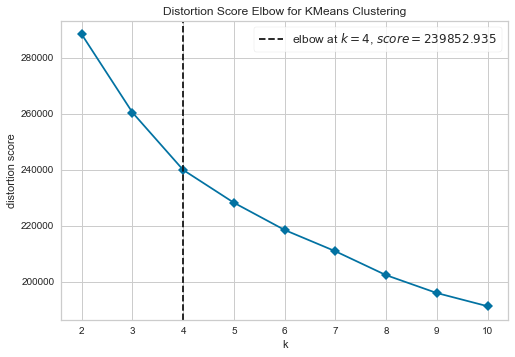

In [19]:
pyclst.plot_model(kmeans, plot = 'elbow')

The cluster membership distribution seems fairly balanced, and we should be able to use accuracy as a classification metric later on.

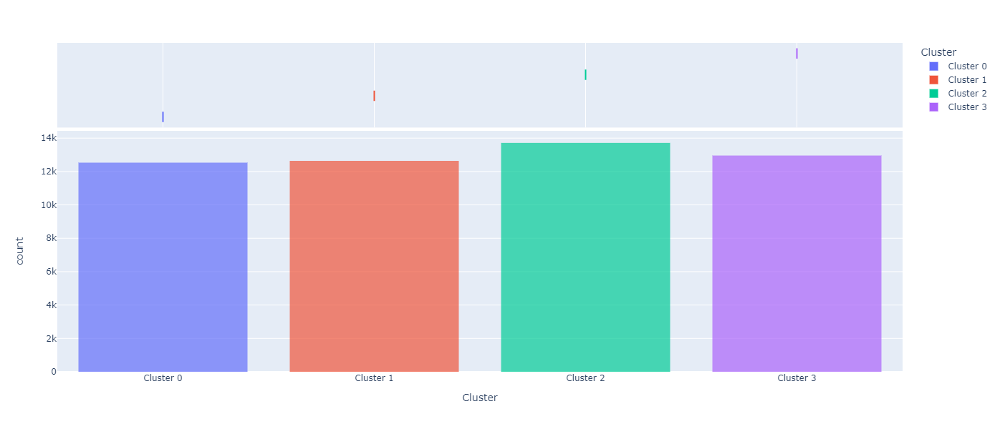

In [20]:
pyclst.plot_model(kmeans, plot = 'distribution')

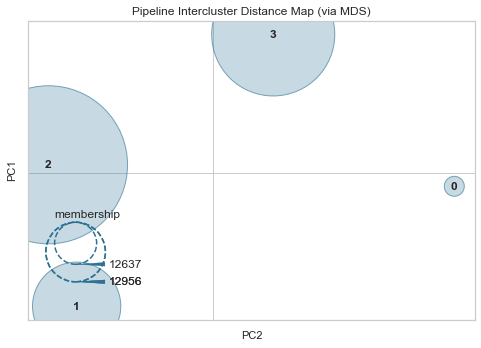

In [21]:
# We can see there's a fairly good separation among clusters
pyclst.plot_model(kmeans, plot = 'distance')

In [22]:
# saving the cluster results to a dataframe
traindf_kmeans = pyclst.assign_model(kmeans)
traindf_kmeans.head()

,gender,agecat,credit_score,area,veh_age,veh_body,veh_value,age,Cluster
0,F,4,381.00,D,2,HBACK,1.33,52,Cluster 2
1,F,2,549.00,D,1,UTE/VAN,3.74,38,Cluster 3
2,M,2,649.00,B,4,SPORTS,0.88,37,Cluster 3
3,M,4,743.00,B,3,SEDAN,1.04,60,Cluster 2
5,F,4,741.00,B,4,LARGE,1.66,54,Cluster 2


#### 5.2.2 Interpreting the business meaning of the clusters

We can see that people from Cluster 0, 1, 2 on average make similar number of claims. While people from Cluster 3 on average makes twice as many claims as the other Clusters.

In [23]:
traindf_kmeans = pd.concat([traindf_kmeans, claims_df], axis = 1)
traindf_kmeans.groupby('Cluster')['numclaims'].describe()

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
Cluster 0,12530.00,0.17,0.51,0.00,0.00,0.00,0.00,5.00
Cluster 1,12637.00,0.17,0.49,0.00,0.00,0.00,0.00,5.00
Cluster 2,13714.00,0.15,0.47,0.00,0.00,0.00,0.00,5.00
Cluster 3,12956.00,0.35,0.66,0.00,0.00,0.00,1.00,5.00


We can see that people from Cluster 2 on average have the least claim cost. Cluster 0 and 1 have similar claim costs. While Cluster 3 makes more claim costs, and we can see that it is significantly above the premium of $716.

In [24]:
traindf_kmeans.groupby('Cluster')['claimcst0'].describe()

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
Cluster 0,12530.00,558.70,3153.47,0.00,0.00,0.00,0.00,65309.90
Cluster 1,12637.00,695.84,3881.66,0.00,0.00,0.00,0.00,69478.90
Cluster 2,13714.00,145.07,856.72,0.00,0.00,0.00,0.00,40942.38
Cluster 3,12956.00,1136.15,4315.91,0.00,0.00,0.00,256.55,65306.54


In [26]:
traindf_kmeans.groupby('Cluster').describe().T

Cluster             Cluster 0  Cluster 1  Cluster 2  Cluster 3
agecat       count   12530.00   12637.00   13714.00   12956.00
             mean        3.62       5.41       3.51       1.73
             std         0.67       0.49       0.55       0.51
             min         2.00       4.00       2.00       1.00
             25%         3.00       5.00       3.00       1.00
             50%         4.00       5.00       4.00       2.00
             75%         4.00       6.00       4.00       2.00
             max         6.00       6.00       5.00       3.00
credit_score count   12530.00   12637.00   13714.00   12956.00
             mean      677.42     723.02     672.55     576.87
             std       117.12     129.88     117.90     137.04
             min       301.00     301.00     301.00     301.00
             25%       621.00     702.00     619.00     476.00
             50%       687.00     765.00     680.00     607.00
             75%       767.00     815.00     762.00     674.00
             max       850.00     850.00     850.00     850.00
veh_age      count   12530.00   12637.00   13714.00   12956.00
             mean        2.02       2.75       3.24       2.63
             std         0.90       1.06       0.89       1.05
             min         1.00       1.00       1.00       1.00
             25%         1.00       2.00       3.00       2.00
             50%         2.00       3.00       3.00       3.00
             75%         3.00       4.00       4.00       4.00
             max         4.00       4.00       4.00       4.00
veh_value    count   12530.00   12637.00   13714.00   12956.00
             mean        3.18       1.62       1.12       1.98
             std         1.57       0.91       0.41       1.20
             min         1.50       0.00       0.00       0.00
             25%         2.10       1.01       0.80       1.24
             50%         2.74       1.52       1.14       1.69
             75%         3.81       2.04       1.46       2.40
             max        38.02      17.57       2.11      22.89
age          count   12530.00   12637.00   13714.00   12956.00
             mean       51.69      71.29      50.70      32.66
             std         7.11       8.17       6.10       5.72
             min        31.00      58.00      31.00      21.00
             25%        46.00      65.00      46.00      29.00
             50%        51.00      69.00      51.00      33.00
             75%        57.00      77.00      56.00      37.00
             max        74.00      97.00      70.00      50.00
numclaims    count   12530.00   12637.00   13714.00   12956.00
             mean        0.17       0.17       0.15       0.35
             std         0.51       0.49       0.47       0.66
             min         0.00       0.00       0.00       0.00
             25%         0.00       0.00       0.00       0.00
             50%         0.00       0.00       0.00       0.00
             75%         0.00       0.00       0.00       1.00
             max         5.00       5.00       5.00       5.00
claimcst0    count   12530.00   12637.00   13714.00   12956.00
             mean      558.70     695.84     145.07    1136.15
             std      3153.47    3881.66     856.72    4315.91
             min         0.00       0.00       0.00       0.00
             25%         0.00       0.00       0.00       0.00
             50%         0.00       0.00       0.00       0.00
             75%         0.00       0.00       0.00     256.55
             max     65309.90   69478.90   40942.38   65306.54

<AxesSubplot:xlabel='claimcst0', ylabel='Cluster'>

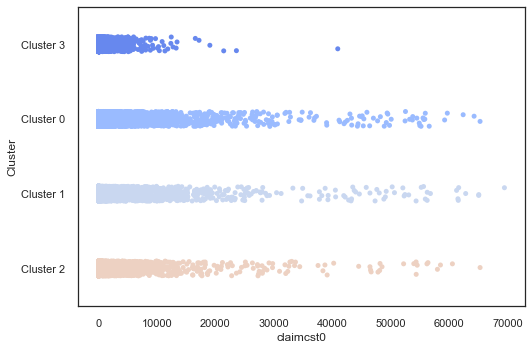

In [317]:
sns.stripplot(data = traindf_kmeans, x='claimcst0', y = 'Cluster')

### 5.2.3 Summary of KMeans Results and Customer Profiles
Based on the above analysis we can see that the KMeans clusters have generated some interesting results. Let's first have a look at the following summary stats table:

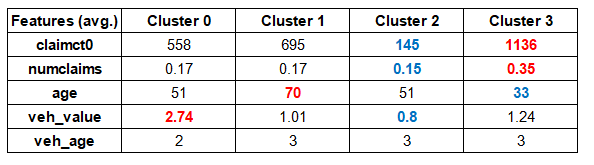

As we can see: 
- Cluster 3 has the highest average claim costs, and the highest average number of claims made. Cluster 3 customers tend to be much younger on average as well. Together these characteristics make sense, young drivers tend to be less experienced and riskier in driving behaviour.
- Cluster 2 has the lowest average claim costs, and the lowest average number of claims made. They also tend to have the lowest vehicle values.
- Cluster 1 has an average claim cost that is close to the current premium level. Cluster 1 also tends to be much older on average.
- Cluster 0 has the second lowest average claim cost, and interesting the have the highest average vehicle value, that's 3 times that of cluster 2 and more than 2 times higher than cluster 1 and cluster 3.

### 5.3 Performing Hierachical Clustering

<Figure size 720x504 with 0 Axes>

Text(0.5, 1.0, 'Dendogram')

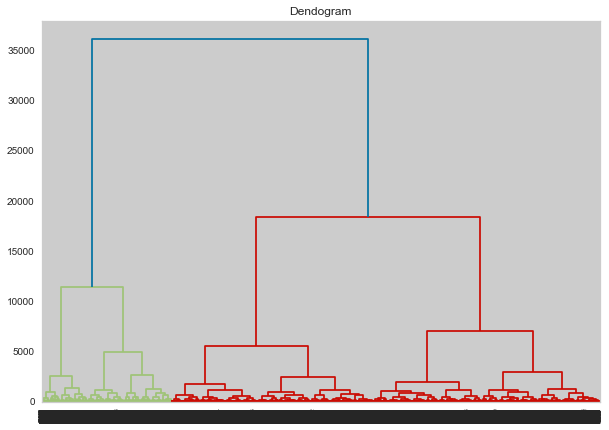

In [28]:
# We need to first encode categorical variables using one-hot encoding
hc_df = pd.get_dummies(traindf_clst, drop_first = True)

plt.figure(figsize=(10, 7))
plt.title("Dendogram")
dend = shc.dendrogram(shc.linkage(hc_df, method='ward'))

Based on the dendogram, we can see 3 or 4 clusters would be a reasonable choice.

array([0, 0, 2, ..., 2, 1, 1], dtype=int64)

<AxesSubplot:xlabel='Cluster', ylabel='count'>

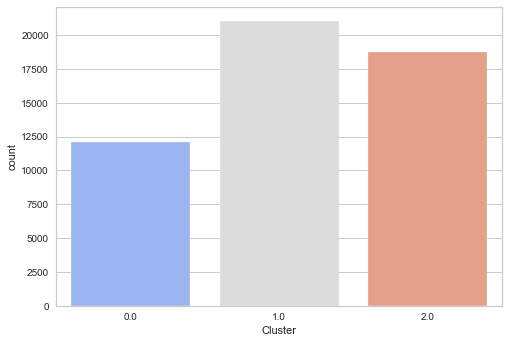

In [30]:
# let's try 3 clusters first
hcluster_n3 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
hcluster_n3.fit_predict(hc_df)

hlabels_n3 = pd.Series(hcluster_n3.labels_)
hcluster_n3_df = pd.concat([hc_df, hlabels_n3, claims_df], axis = 1)
hcluster_n3_df.rename(columns = {0:"Cluster"}, inplace = True)
sns.countplot(data = hcluster_n3_df, x = 'Cluster', palette = 'coolwarm')

We can see that using 3 clusters did not generate a meaningful separation in terms of 'claimcst0' or 'numclaims'.

In [36]:
hcluster_n3_df.groupby('Cluster').describe() 

agecat                                    credit_score         \
           count mean  std  min  25%  50%  75%  max        count   mean   
Cluster                                                                   
0.00    10398.00 3.55 1.41 1.00 2.00 4.00 5.00 6.00     10398.00 661.17   
1.00    18019.00 3.56 1.41 1.00 2.00 4.00 5.00 6.00     18019.00 661.63   
2.00    16080.00 3.56 1.41 1.00 3.00 4.00 5.00 6.00     16080.00 662.89   

                                                   veh_age                 \
           std    min    25%    50%    75%    max    count mean  std  min   
Cluster                                                                     
0.00    135.99 301.00 603.00 681.00 770.00 850.00 10398.00 2.66 1.07 1.00   
1.00    136.74 301.00 602.00 683.00 771.00 850.00 18019.00 2.67 1.06 1.00   
2.00    136.44 301.00 603.00 681.50 772.00 850.00 16080.00 2.68 1.08 1.00   

                            veh_value                                      \
         25%  50%  75%  max     count mean  std  min  25%  50%  75%   max   
Cluster                                                                     
0.00    2.00 3.00 4.00 4.00  10398.00 1.97 1.38 0.00 1.11 1.66 2.40 25.95   
1.00    2.00 3.00 4.00 4.00  18019.00 1.96 1.33 0.00 1.12 1.65 2.37 38.02   
2.00    2.00 3.00 4.00 4.00  16080.00 1.95 1.32 0.00 1.11 1.64 2.37 24.96   

             age                                           gender_M            \
           count  mean   std   min   25%   50%   75%   max    count mean  std   
Cluster                                                                         
0.00    10398.00 51.38 15.22 21.00 40.00 51.00 61.00 97.00 10398.00 0.42 0.49   
1.00    18019.00 51.47 15.22 21.00 40.00 51.00 62.00 97.00 18019.00 0.43 0.49   
2.00    16080.00 51.49 15.19 21.00 41.00 51.00 61.00 96.00 16080.00 0.44 0.50   

                                   area_B                                     \
         min  25%  50%  75%  max    count mean  std  min  25%  50%  75%  max   
Cluster                                                                        
0.00    0.00 0.00 0.00 1.00 1.00 10398.00 0.20 0.40 0.00 0.00 0.00 0.00 1.00   
1.00    0.00 0.00 0.00 1.00 1.00 18019.00 0.19 0.40 0.00 0.00 0.00 0.00 1.00   
2.00    0.00 0.00 0.00 1.00 1.00 16080.00 0.20 0.40 0.00 0.00 0.00 0.00 1.00   

          area_C                                      area_D                 \
           count mean  std  min  25%  50%  75%  max    count mean  std  min   
Cluster                                                                       
0.00    10398.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00 10398.00 0.12 0.32 0.00   
1.00    18019.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00 18019.00 0.12 0.33 0.00   
2.00    16080.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00 16080.00 0.12 0.33 0.00   

                              area_E                                     \
         25%  50%  75%  max    count mean  std  min  25%  50%  75%  max   
Cluster                                                                   
0.00    0.00 0.00 0.00 1.00 10398.00 0.09 0.28 0.00 0.00 0.00 0.00 1.00   
1.00    0.00 0.00 0.00 1.00 18019.00 0.09 0.28 0.00 0.00 0.00 0.00 1.00   
2.00    0.00 0.00 0.00 1.00 16080.00 0.09 0.29 0.00 0.00 0.00 0.00 1.00   

          area_F                                    veh_body_LARGE            \
           count mean  std  min  25%  50%  75%  max          count mean  std   
Cluster                                                                        
0.00    10398.00 0.05 0.22 0.00 0.00 0.00 0.00 1.00       10398.00 0.04 0.19   
1.00    18019.00 0.05 0.22 0.00 0.00 0.00 0.00 1.00       18019.00 0.04 0.19   
2.00    16080.00 0.05 0.22 0.00 0.00 0.00 0.00 1.00       16080.00 0.04 0.20   

                                 veh_body_SEDAN                                \
         min  25%  50%  75%  max          count mean  std  min  25%  50%  75%   
Cluster                                                                         
0.00    0.00 0.

#### 5.3.1 Trying a different number of clusters

array([3, 1, 2, ..., 2, 0, 0], dtype=int64)

<AxesSubplot:xlabel='Cluster', ylabel='count'>

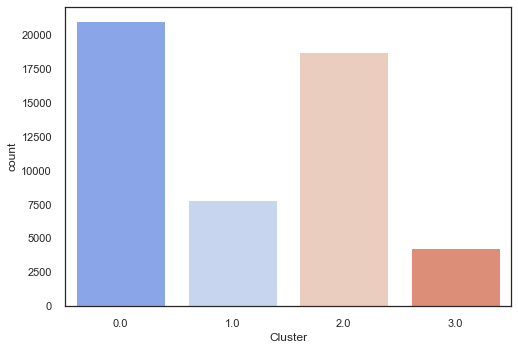

In [37]:
# Now let's try 4 clusters
hcluster_n4 = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
hcluster_n4.fit_predict(hc_df)

hlabels_n4 = pd.Series(hcluster_n4.labels_)
hcluster_n4_df = pd.concat([hc_df, hlabels_n4, claims_df], axis = 1)
hcluster_n4_df.rename(columns = {0:"Cluster"}, inplace = True)
sns.countplot(data = hcluster_n4_df, x = 'Cluster', palette = 'coolwarm')

Again, we don't have a great separation in terms of 'claimcst0' or 'numclaims'.

In [38]:
hcluster_n4_df.groupby('Cluster').describe() 

agecat                                    credit_score         \
           count mean  std  min  25%  50%  75%  max        count   mean   
Cluster                                                                   
0.00    18019.00 3.56 1.41 1.00 2.00 4.00 5.00 6.00     18019.00 661.63   
1.00     6716.00 3.54 1.42 1.00 2.00 4.00 5.00 6.00      6716.00 660.91   
2.00    16080.00 3.56 1.41 1.00 3.00 4.00 5.00 6.00     16080.00 662.89   
3.00     3682.00 3.55 1.39 1.00 3.00 4.00 5.00 6.00      3682.00 661.65   

                                                   veh_age                 \
           std    min    25%    50%    75%    max    count mean  std  min   
Cluster                                                                     
0.00    136.74 301.00 602.00 683.00 771.00 850.00 18019.00 2.67 1.06 1.00   
1.00    135.56 301.00 602.00 681.00 769.00 850.00  6716.00 2.66 1.07 1.00   
2.00    136.44 301.00 603.00 681.50 772.00 850.00 16080.00 2.68 1.08 1.00   
3.00    136.78 301.00 604.00 681.00 772.00 850.00  3682.00 2.65 1.07 1.00   

                            veh_value                                      \
         25%  50%  75%  max     count mean  std  min  25%  50%  75%   max   
Cluster                                                                     
0.00    2.00 3.00 4.00 4.00  18019.00 1.96 1.33 0.00 1.12 1.65 2.37 38.02   
1.00    2.00 3.00 4.00 4.00   6716.00 1.96 1.38 0.00 1.11 1.65 2.39 25.95   
2.00    2.00 3.00 4.00 4.00  16080.00 1.95 1.32 0.00 1.11 1.64 2.37 24.96   
3.00    2.00 3.00 4.00 4.00   3682.00 1.99 1.39 0.00 1.12 1.68 2.42 22.89   

             age                                           gender_M            \
           count  mean   std   min   25%   50%   75%   max    count mean  std   
Cluster                                                                         
0.00    18019.00 51.47 15.22 21.00 40.00 51.00 62.00 97.00 18019.00 0.43 0.49   
1.00     6716.00 51.40 15.31 21.00 40.00 51.00 61.00 96.00  6716.00 0.42 0.49   
2.00    16080.00 51.49 15.19 21.00 41.00 51.00 61.00 96.00 16080.00 0.44 0.50   
3.00     3682.00 51.35 15.06 21.00 41.00 51.00 61.00 97.00  3682.00 0.42 0.49   

                                   area_B                                     \
         min  25%  50%  75%  max    count mean  std  min  25%  50%  75%  max   
Cluster                                                                        
0.00    0.00 0.00 0.00 1.00 1.00 18019.00 0.19 0.40 0.00 0.00 0.00 0.00 1.00   
1.00    0.00 0.00 0.00 1.00 1.00  6716.00 0.19 0.40 0.00 0.00 0.00 0.00 1.00   
2.00    0.00 0.00 0.00 1.00 1.00 16080.00 0.20 0.40 0.00 0.00 0.00 0.00 1.00   
3.00    0.00 0.00 0.00 1.00 1.00  3682.00 0.20 0.40 0.00 0.00 0.00 0.00 1.00   

          area_C                                      area_D                 \
           count mean  std  min  25%  50%  75%  max    count mean  std  min   
Cluster                                                                       
0.00    18019.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00 18019.00 0.12 0.33 0.00   
1.00     6716.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00  6716.00 0.12 0.33 0.00   
2.00    16080.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00 16080.00 0.12 0.33 0.00   
3.00     3682.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00  3682.00 0.12 0.32 0.00   

                              area_E                                     \
         25%  50%  75%  max    count mean  std  min  25%  50%  75%  max   
Cluster                                                                   
0.00    0.00 0.00 0.00 1.00 18019.00 0.09 0.28 0.00 0.00 0.00 0.00 1.00   
1.00    0.00 0.00 0.00 1.00  6716.00 0.09 0.29 0.00 0.00 0.00 0.00 1.00   
2.00    0.00 0.00 0.00 1.00 16080.00 0.09 0.29 0.00 0.00 0.00 0.00 1.00   
3.00    0.00 0.00 0.00 1.00  3682.00 0.08 0.27 0.00 0.00 0.00 0.00 1.00   

          area_F                                    veh_body_LARGE            \
           count mean  std  min  25%  50%  75%  max          count mean  std   
Cluster                            

#### 5.3.2 Tuning Different Linkages

array([1, 0, 0, ..., 0, 2, 0], dtype=int64)

<AxesSubplot:xlabel='Cluster', ylabel='count'>

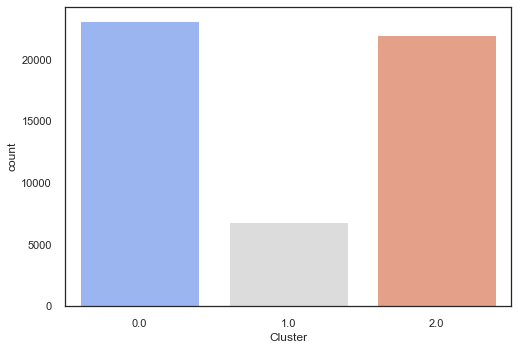

In [39]:
hcluster_n3c = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')
hcluster_n3c.fit_predict(hc_df)

hlabels_n3c = pd.Series(hcluster_n3c.labels_)
hcluster_n3c_df = pd.concat([hc_df, hlabels_n3c, claims_df], axis = 1)
hcluster_n3c_df.rename(columns = {0:"Cluster"}, inplace = True)
sns.countplot(data = hcluster_n3c_df, x = 'Cluster', palette = 'coolwarm')

We see that a 'complete' linkage did not improve our separation.

In [40]:
hcluster_n3c_df.groupby('Cluster').describe()

agecat                                    credit_score         \
           count mean  std  min  25%  50%  75%  max        count   mean   
Cluster                                                                   
0.00    19862.00 3.56 1.41 1.00 2.00 4.00 5.00 6.00     19862.00 662.56   
1.00     5816.00 3.54 1.40 1.00 2.00 4.00 5.00 6.00      5816.00 661.55   
2.00    18819.00 3.56 1.42 1.00 2.00 4.00 5.00 6.00     18819.00 661.50   

                                                   veh_age                 \
           std    min    25%    50%    75%    max    count mean  std  min   
Cluster                                                                     
0.00    136.27 301.00 603.00 682.00 772.00 850.00 19862.00 2.68 1.08 1.00   
1.00    136.04 301.00 602.00 681.00 771.00 850.00  5816.00 2.65 1.07 1.00   
2.00    136.78 301.00 602.00 682.00 771.00 850.00 18819.00 2.67 1.06 1.00   

                            veh_value                                      \
         25%  50%  75%  max     count mean  std  min  25%  50%  75%   max   
Cluster                                                                     
0.00    2.00 3.00 4.00 4.00  19862.00 1.96 1.34 0.00 1.11 1.64 2.37 25.95   
1.00    2.00 3.00 4.00 4.00   5816.00 1.98 1.35 0.00 1.13 1.67 2.41 22.89   
2.00    2.00 3.00 4.00 4.00  18819.00 1.96 1.33 0.00 1.12 1.65 2.37 38.02   

             age                                           gender_M            \
           count  mean   std   min   25%   50%   75%   max    count mean  std   
Cluster                                                                         
0.00    19862.00 51.47 15.21 21.00 40.00 51.00 61.00 96.00 19862.00 0.43 0.50   
1.00     5816.00 51.35 15.16 21.00 40.00 51.00 61.00 97.00  5816.00 0.42 0.49   
2.00    18819.00 51.48 15.22 21.00 40.00 51.00 62.00 97.00 18819.00 0.43 0.50   

                                   area_B                                     \
         min  25%  50%  75%  max    count mean  std  min  25%  50%  75%  max   
Cluster                                                                        
0.00    0.00 0.00 0.00 1.00 1.00 19862.00 0.20 0.40 0.00 0.00 0.00 0.00 1.00   
1.00    0.00 0.00 0.00 1.00 1.00  5816.00 0.20 0.40 0.00 0.00 0.00 0.00 1.00   
2.00    0.00 0.00 0.00 1.00 1.00 18819.00 0.19 0.40 0.00 0.00 0.00 0.00 1.00   

          area_C                                      area_D                 \
           count mean  std  min  25%  50%  75%  max    count mean  std  min   
Cluster                                                                       
0.00    19862.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00 19862.00 0.12 0.33 0.00   
1.00     5816.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00  5816.00 0.12 0.32 0.00   
2.00    18819.00 0.30 0.46 0.00 0.00 0.00 1.00 1.00 18819.00 0.12 0.33 0.00   

                              area_E                                     \
         25%  50%  75%  max    count mean  std  min  25%  50%  75%  max   
Cluster                                                                   
0.00    0.00 0.00 0.00 1.00 19862.00 0.09 0.29 0.00 0.00 0.00 0.00 1.00   
1.00    0.00 0.00 0.00 1.00  5816.00 0.08 0.27 0.00 0.00 0.00 0.00 1.00   
2.00    0.00 0.00 0.00 1.00 18819.00 0.09 0.28 0.00 0.00 0.00 0.00 1.00   

          area_F                                    veh_body_LARGE            \
           count mean  std  min  25%  50%  75%  max          count mean  std   
Cluster                                                                        
0.00    19862.00 0.05 0.22 0.00 0.00 0.00 0.00 1.00       19862.00 0.04 0.20   
1.00     5816.00 0.05 0.22 0.00 0.00 0.00 0.00 1.00        5816.00 0.04 0.20   
2.00    18819.00 0.05 0.22 0.00 0.00 0.00 0.00 1.00       18819.00 0.04 0.19   

                                 veh_body_SEDAN                                \
         min  25%  50%  75%  max          count mean  std  min  25%  50%  75%   
Cluster                                                                         
0.00    0.00 0.

#### 5.3.3 Summary of Hierachical Clustering Results
We have tried n_clusters = 3 and 4, and we have also tried linkage methods = ward and complete, but none of these generated a meaningful separation in terms of 'claimcst0' or 'numclaims'. So we will proceed with the results from KMeans.

### 5.4 Final Customer Profiles


Based on our results from 5.2.3, we can finalize our clusters. 

First of all, we can rank the customer's risk from lowest to highest based on claims cost. The lowest claim cost segment will be 1 and the highest will be four.

In addition, we should also provide the clusters with a more meaningful name based on the customer characteristics of each cluster. 

In [61]:
target_dict = {'Cluster 0':2, 'Cluster 1':3, 'Cluster 2':1, 'Cluster 3':4}
# {1:'Budget', 2:'Affluent', 3:'Senior Citizen', 4:'Risky'} we can use this dictionary later on to interpret prediction results

traindf_kmeans['target'] = traindf_kmeans['Cluster'].replace(target_dict)
traindf_kmeans.head()

,gender,agecat,credit_score,area,veh_age,veh_body,veh_value,age,Cluster,numclaims,claimcst0,target
0,F,4,381.00,D,2,HBACK,1.33,52,Cluster 2,0,0.00,1
1,F,2,549.00,D,1,UTE/VAN,3.74,38,Cluster 3,0,0.00,4
2,M,2,649.00,B,4,SPORTS,0.88,37,Cluster 3,0,0.00,4
3,M,4,743.00,B,3,SEDAN,1.04,60,Cluster 2,0,0.00,1
5,F,4,741.00,B,4,LARGE,1.66,54,Cluster 2,0,0.00,1


<h2 style="background-color:DodgerBlue;color:white">6. Building a Classification Model to Predict Customer Profiles

### 6.1 Setting up the data for classification
Since we aim to predict on new data, we should drop all columns that we won't have with new customer data, 'numclaims' and 'claimcst0'. We can also drop 'Cluster', since we've already constructed a 'target' column.

In [70]:
# Creating an appropriate dataframe for classification
traindf_class = traindf_kmeans.drop(['numclaims','claimcst0','Cluster'], axis = 1)
traindf_class.head()
traindf_class.shape
traindf_class.target.value_counts(normalize = True) # fairly balanced classes

,gender,agecat,credit_score,area,veh_age,veh_body,veh_value,age,target
0,F,4,381.00,D,2,HBACK,1.33,52,1
1,F,2,549.00,D,1,UTE/VAN,3.74,38,4
2,M,2,649.00,B,4,SPORTS,0.88,37,4
3,M,4,743.00,B,3,SEDAN,1.04,60,1
5,F,4,741.00,B,4,LARGE,1.66,54,1


(51837, 9)

1   0.26
4   0.25
3   0.24
2   0.24
Name: target, dtype: float64

### 6.2 Baseline Model training and Comparison
We can see that our models do very well at predicting the target customer segmentation labels. The best model is Logistic Regression, with an accuracy of 99.61%. Based on the confusion matrix, we can also see that the model does well in terms of precision and recall for all of the segments.

In [90]:
# default train size = 0.7, validation size = 0.3
classification = pyclass.setup(traindf_class, target = 'target', 
                                         normalize = True, normalize_method = 'robust',
                                        transformation = True, transformation_method = 'yeo-johnson')

class_model = pyclass.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9961,1.0000,0.9961,0.9961,0.9961,0.9949,0.9949,3.5020
lightgbm,Light Gradient Boosting Machine,0.9906,0.9999,0.9906,0.9906,0.9906,0.9875,0.9875,0.5570
gbc,Gradient Boosting Classifier,0.9857,0.9998,0.9858,0.9857,0.9857,0.9810,0.9810,6.7720
rf,Random Forest Classifier,0.9824,0.9996,0.9824,0.9824,0.9824,0.9765,0.9765,0.9230
dt,Decision Tree Classifier,0.9801,0.9867,0.9801,0.9801,0.9801,0.9735,0.9735,0.0660
et,Extra Trees Classifier,0.9716,0.9989,0.9715,0.9715,0.9715,0.9621,0.9621,0.9500
lda,Linear Discriminant Analysis,0.9552,0.9976,0.9551,0.9554,0.9549,0.9403,0.9406,0.0820
svm,SVM - Linear Kernel,0.9541,0.0000,0.9548,0.9583,0.9538,0.9388,0.9404,0.2070
knn,K Neighbors Classifier,0.9520,0.9929,0.9519,0.9521,0.9519,0.9359,0.9360,0.6370
nb,Naive Bayes,0.9139,0.9864,0.9140,0.9145,0.9141,0.8851,0.8852,0.0520


In [96]:
class_model #class_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=7716, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

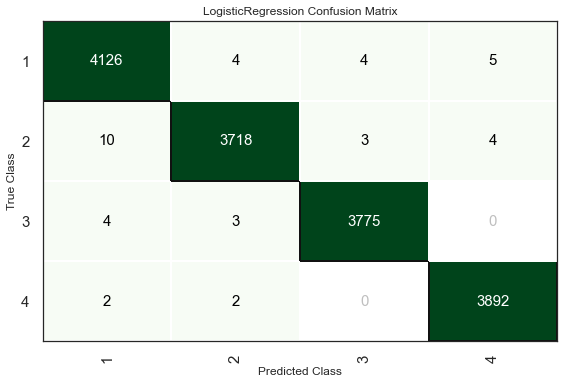

In [92]:
pyclass.plot_model(class_model, plot = 'confusion_matrix')

<h2 style="background-color:DodgerBlue;color:white">7. Discussion: What was the Value of Clustering?

**An important question to ask is what was the value of clustering? Why did we spend so much time and business resources on clustering? Did the clustering analysis' benefits outweigh its costs?**

We can answer this question by thinking about what would happen if we didn't do clustering. Usually we have two options:
1. Charge the same premium to all customers, which is what the insurance company is currently doing. This is clearly not optimal, as low-risk customers will find the premium expensive and churn, while high-risk customers might even start abusing the insurnace policy by driving more recklessly.
2. Try directly using a supervised learning technique, such as using regression to directly predict claimcst0 and set a premium accordingly.

### 7.1 Preparing the data for regression

In [63]:
traindf_reg = traindf_kmeans.drop(['target','numclaims','Cluster'], axis = 1)
traindf_reg.head()
traindf_reg.shape

,gender,agecat,credit_score,area,veh_age,veh_body,veh_value,age,claimcst0
0,F,4,381.00,D,2,HBACK,1.33,52,0.00
1,F,2,549.00,D,1,UTE/VAN,3.74,38,0.00
2,M,2,649.00,B,4,SPORTS,0.88,37,0.00
3,M,4,743.00,B,3,SEDAN,1.04,60,0.00
5,F,4,741.00,B,4,LARGE,1.66,54,0.00


(51837, 9)

### 7.2 Training the regression models

In [72]:
# What if we try to predict claimscost directly from the raw data without clustering?
regression = pyreg.setup(traindf_reg, target = 'claimcst0', 
                            normalize = True, normalize_method = 'robust',
                            transformation = True, transformation_method = 'yeo-johnson')

reg_model = pyreg.compare_models() 

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,718.8510,6931376.3724,2625.2342,0.3114,4.2714,0.7374,0.1160
gbr,Gradient Boosting Regressor,754.9522,6960193.2216,2631.5336,0.3098,4.6535,0.7847,1.2890
rf,Random Forest Regressor,742.3730,7220643.2263,2680.2148,0.2819,4.0692,0.7803,4.4340
knn,K Neighbors Regressor,707.7902,7669582.5000,2755.8292,0.2468,3.5855,0.8027,0.2740
et,Extra Trees Regressor,742.3260,7804306.9119,2789.1410,0.2165,3.8765,0.8053,3.5610
lasso,Lasso Regression,1198.6358,9042333.3705,2993.2004,0.1144,5.9392,1.1194,0.1460
br,Bayesian Ridge,1199.4166,9042290.2715,2993.2134,0.1144,5.9403,1.1191,0.0650
ridge,Ridge Regression,1201.5449,9042396.3438,2993.2663,0.1143,5.9428,1.1209,0.0420
lar,Least Angle Regression,1201.7166,9042576.1127,2993.2958,0.1143,5.9431,1.1211,0.0410
lr,Linear Regression,1200.9636,9042369.1343,2993.2616,0.1143,5.9418,1.1209,0.0540


### 7.3 Discussing regression results and business value

We can see that overall best regression models are Light Gradient Boosting Machine, Gradient Boosting Regressor and Random Forest Regressor. These models all have a Mean Absolute Error (MAE) of $700+.

Remember our original premium was 716 dollars, so a MAE of 700 really doesn't help us set a premium for each individual new customer. Our regression model has little practical meaning.

So we can see, without first using unsupervised learning to categorize customers into different profile segments, we cannot effectively use supervised learning to effectively predict and set an appropriate premium for different customers.

<h2 style="background-color:DodgerBlue;color:white">8. Final Classification Model and Business Evaluation on Test Data

In [74]:
# Inspecting the test data
testdf.head()

,gender,agecat,credit_score,area,traffic_index,veh_age,veh_body,veh_value,numclaims,claimcst0,age
32084,F,6.00,461.00,B,151.60,4,HBACK,0.45,0,0.00,73
29594,F,3.00,NaN,B,119.90,1,STNWG,4.23,0,0.00,44
12407,F,6.00,641.00,B,119.50,1,SEDAN,2.52,0,0.00,80
7451,F,5.00,638.00,B,160.30,1,SEDAN,2.08,1,3639.62,65
18670,M,3.00,598.00,C,135.00,2,STNWG,4.33,1,288.12,41


In [75]:
testdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6039 entries, 32084 to 6049
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gender         6039 non-null   object 
 1   agecat         5555 non-null   float64
 2   credit_score   5754 non-null   float64
 3   area           6039 non-null   object 
 4   traffic_index  5670 non-null   float64
 5   veh_age        6039 non-null   int64  
 6   veh_body       6039 non-null   object 
 7   veh_value      6039 non-null   float64
 8   numclaims      6039 non-null   int64  
 9   claimcst0      6039 non-null   float64
 10  age            6039 non-null   int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 566.2+ KB


### 8.1 Preparing the test data

In [76]:
# first clean the test data
clean_testdf = testdf.copy()

clean_testdf = data_cleaner(traindf, clean_testdf)
clean_testdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5754 entries, 32084 to 6049
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gender         5754 non-null   object 
 1   agecat         5754 non-null   int32  
 2   credit_score   5754 non-null   float64
 3   area           5754 non-null   object 
 4   traffic_index  5754 non-null   float64
 5   veh_age        5754 non-null   int64  
 6   veh_body       5754 non-null   object 
 7   veh_value      5754 non-null   float64
 8   numclaims      5754 non-null   int64  
 9   claimcst0      5754 non-null   float64
 10  age            5754 non-null   int64  
dtypes: float64(4), int32(1), int64(3), object(3)
memory usage: 517.0+ KB


In [80]:
clean_testdf_class = clean_testdf.drop(['numclaims', 'claimcst0', 'traffic_index'], axis = 1)
clean_testdf_class.head()

,gender,agecat,credit_score,area,veh_age,veh_body,veh_value,age
32084,F,6,461.00,B,4,HBACK,0.45,73
12407,F,6,641.00,B,1,SEDAN,2.52,80
7451,F,5,638.00,B,1,SEDAN,2.08,65
18670,M,3,598.00,C,2,STNWG,4.33,41
46802,M,5,645.00,A,1,HBACK,1.41,61


In [125]:
# Preparing the training data to retrain the Logistic Regression using Sklearn
X = traindf_class.drop('target', axis = 1)
X = pd.get_dummies(X, drop_first = True)

y = traindf_class.target

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.15, random_state = 42)

### 8.2 Building a training and hyperparameter tuning pipeline

In [187]:
lr_clf = LogisticRegression()
lr_pipeline = Pipeline([('scaler',RobustScaler()), 
                        ('transformer', PowerTransformer(method = 'yeo-johnson')),
                        ('classifier', lr_clf)])

params = {
         'classifier__solver':['newton-cg', 'lbfgs', 'liblinear'],
         'classifier__penalty':['l2'],
         'classifier__C':[100, 10, 1.0, 0.1, 0.01]
         }

lr_hypertune = GridSearchCV(estimator = lr_pipeline, 
                     param_grid = params, 
                     cv = 5,
                     verbose = 1, 
                     scoring = 'accuracy')

lr_hypertune.fit(X_train, y_train)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:  3.7min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaler',
                                        RobustScaler(copy=True,
                                                     quantile_range=(25.0,
                                                                     75.0),
                                                     with_centering=True,
                                                     with_scaling=True)),
                                       ('transformer',
                                        PowerTransformer(copy=True,
                                                         method='yeo-johnson',
                                                         standardize=True)),
                                       ('classifier',
                                        LogisticRegression(C=1.0,
                                                           class_weight=None,
                             

In [188]:
print("Best cross-validation recall: {:.2f}".format(lr_hypertune.best_score_))
print("Validation set score: {:.2f}".format(lr_hypertune.score(X_val, y_val)))
print("Best parameters: {}".format(lr_hypertune.best_params_))

Best cross-validation recall: 0.99
Validation set score: 0.99
Best parameters: {'classifier__C': 100, 'classifier__penalty': 'l2', 'classifier__solver': 'newton-cg'}


In [196]:
val_predict = lr_hypertune.predict(X_val)

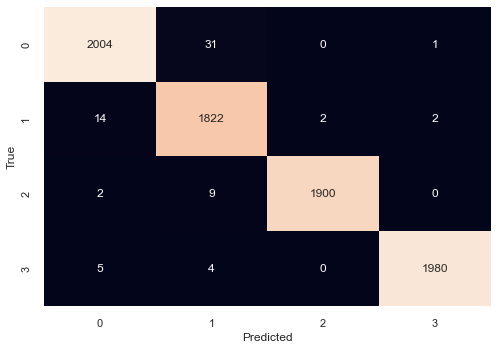

In [197]:
sns.heatmap(confusion_matrix(y_val, val_predict), annot = True, cbar = None, fmt = 'd')
plt.xlabel('Predicted')
plt.ylabel('True');

In [198]:
print(classification_report(y_val, val_predict))

              precision    recall  f1-score   support

           1       0.99      0.98      0.99      2036
           2       0.98      0.99      0.98      1840
           3       1.00      0.99      1.00      1911
           4       1.00      1.00      1.00      1989

    accuracy                           0.99      7776
   macro avg       0.99      0.99      0.99      7776
weighted avg       0.99      0.99      0.99      7776



**We can see that our Logistic Regression Model does a good job at predicting the segmentation labels on the validation set.**

### 8.3 Predicting on the test data using the best parameters

In [190]:
X_test = pd.get_dummies(clean_testdf_class, drop_first = True)
X_test.head()

,agecat,credit_score,veh_age,veh_value,age,gender_M,area_B,area_C,area_D,area_E,area_F,veh_body_LARGE,veh_body_SEDAN,veh_body_SPORTS,veh_body_STNWG,veh_body_UTE/VAN
32084,6,461.00,4,0.45,73,0,1,0,0,0,0,0,0,0,0,0
12407,6,641.00,1,2.52,80,0,1,0,0,0,0,0,1,0,0,0
7451,5,638.00,1,2.08,65,0,1,0,0,0,0,0,1,0,0,0
18670,3,598.00,2,4.33,41,1,0,1,0,0,0,0,0,0,1,0
46802,5,645.00,1,1.41,61,1,0,0,0,0,0,0,0,0,0,0


In [191]:
lr_predictions = lr_hypertune.predict(X_test)

In [205]:
test_predictions = pd.DataFrame({"cluster_prediction":lr_predictions}, index = clean_testdf.index)
finaldf = pd.concat([clean_testdf, test_predictions], axis = 1)

# create a new column called segmentation_label for more meaningful interpretation
segmentation_dict = {1:'Budget', 2:'Affluent', 3:'Senior Citizen', 4:'Risky'}

finaldf['segmentation_label'] = finaldf.cluster_prediction.replace(segmentation_dict)

finaldf.head()

,gender,agecat,credit_score,area,traffic_index,veh_age,veh_body,veh_value,numclaims,claimcst0,age,cluster_prediction,segmentation_label
32084,F,6,461.00,B,151.60,4,HBACK,0.45,0,0.00,73,3,Senior Citizen
12407,F,6,641.00,B,119.50,1,SEDAN,2.52,0,0.00,80,3,Senior Citizen
7451,F,5,638.00,B,160.30,1,SEDAN,2.08,1,3639.62,65,3,Senior Citizen
18670,M,3,598.00,C,135.00,2,STNWG,4.33,1,288.12,41,2,Affluent
46802,M,5,645.00,A,108.20,1,HBACK,1.41,1,3143.45,61,3,Senior Citizen


### 8.4 Predition Results and Interpretation

As we can see, our classification model has successfully categorized our customers into 4 distinct segments, each segment being defined by a different set of characteristics, and most importantly they all reflect different average claim costs. We can see that in the test data, that the original 'Risky' group, still has the highest average claim costs. While the 'Budget' group still has the lowest average claim costs.

In [206]:
finaldf.groupby('segmentation_label')['claimcst0'].describe()

,count,mean,std,min,25%,50%,75%,max
segmentation_label,,,,,,,,
Affluent,1383.00,638.80,3726.25,0.00,0.00,0.00,0.00,64669.47
Budget,1533.00,161.65,662.40,0.00,0.00,0.00,0.00,7114.32
Risky,1423.00,1193.23,3971.03,0.00,0.00,0.00,324.32,49391.83
Senior Citizen,1415.00,830.52,4510.02,0.00,0.00,0.00,0.00,63814.55


Furthermore, we can see that our segmented customer groups have retained their characteristics as before. For example, the average age of the 'Senior Citizen' group remains 70+ and is the highest.

In [210]:
finaldf.groupby('segmentation_label').describe()

agecat                                    credit_score  \
                     count mean  std  min  25%  50%  75%  max        count   
segmentation_label                                                           
Affluent           1383.00 3.60 0.67 2.00 3.00 4.00 4.00 6.00      1383.00   
Budget             1533.00 3.52 0.55 2.00 3.00 4.00 4.00 5.00      1533.00   
Risky              1423.00 1.75 0.52 1.00 1.00 2.00 2.00 3.00      1423.00   
Senior Citizen     1415.00 5.42 0.49 4.00 5.00 5.00 6.00 6.00      1415.00   

                                                                     \
                     mean    std    min    25%    50%    75%    max   
segmentation_label                                                    
Affluent           679.50 116.44 301.00 621.50 689.00 771.00 850.00   
Budget             674.77 116.03 301.00 620.00 683.00 763.00 850.00   
Risky              572.52 135.00 301.00 471.00 605.00 669.00 847.00   
Senior Citizen     724.67 132.91 303.00 703.00 771.00 817.00 850.00   

                   traffic_index                                              \
                           count  mean   std  min   25%    50%    75%    max   
segmentation_label                                                             
Affluent                 1383.00 96.51 41.89 0.00 72.35 103.80 129.30 185.70   
Budget                   1533.00 98.92 41.06 0.00 74.60 106.70 132.00 187.40   
Risky                    1423.00 98.66 41.29 0.00 74.65 106.40 131.30 182.80   
Senior Citizen           1415.00 98.39 39.45 0.00 74.90 105.40 129.00 188.90   

                   veh_age                                    veh_value       \
                     count mean  std  min  25%  50%  75%  max     count mean   
segmentation_label                                                             
Affluent           1383.00 2.01 0.89 1.00 1.00 2.00 3.00 4.00   1383.00 3.15   
Budget             1533.00 3.24 0.89 1.00 3.00 3.00 4.00 4.00   1533.00 1.13   
Risky              1423.00 2.66 1.04 1.00 2.00 3.00 4.00 4.00   1423.00 1.95   
Senior Citizen     1415.00 2.78 1.06 1.00 2.00 3.00 4.00 4.00   1415.00 1.60   

                                                  numclaims                 \
                    std  min  25%  50%  75%   max     count mean  std  min   
segmentation_label                                                           
Affluent           1.60 1.59 2.09 2.66 3.68 19.13   1383.00 0.17 0.51 0.00   
Budget             0.40 0.24 0.84 1.16 1.46  1.97   1533.00 0.17 0.50 0.00   
Risky              1.20 0.00 1.19 1.65 2.32 12.64   1423.00 0.37 0.71 0.00   
Senior Citizen     0.86 0.00 0.98 1.51 2.02  6.93   1415.00 0.17 0.50 0.00   

                                       claimcst0                            \
                    25%  50%  75%  max     count    mean     std  min  25%   
segmentation_label                                                           
Affluent           0.00 0.00 0.00 5.00   1383.00  638.80 3726.25 0.00 0.00   
Budget             0.00 0.00 0.00 5.00   1533.00  161.65  662.40 0.00 0.00   
Risky              0.00 0.00 1.00 5.00   1423.00 1193.23 3971.03 0.00 0.00   
Senior Citizen     0.00 0.00 0.00 5.00   1415.00  830.52 4510.02 0.00 0.00   

                                            age                               \
                    50%    75%      max   count  mean  std   min   25%   50%   
segmentation_label                                                             
Affluent           0.00   0.00 64669.47 1383.00 51.48 7.04 32.00 46.00 51.00   
Budget             0.00   0.00  7114.32 1533.00 50.78 6.15 31.00 46.00 51.00   
Risky              0.00 324.32 49391.83 1423.00 32.89 5.72 21.00 29.00 34.00   
Senior Citizen     0.00   0.00 63814.55 1415.00 71.28 8.00 58.00 65.00 69.00   

                               cluster_prediction                           \
                     75%   max              count mean  std  min  25%  50%   
segmentation_label                        

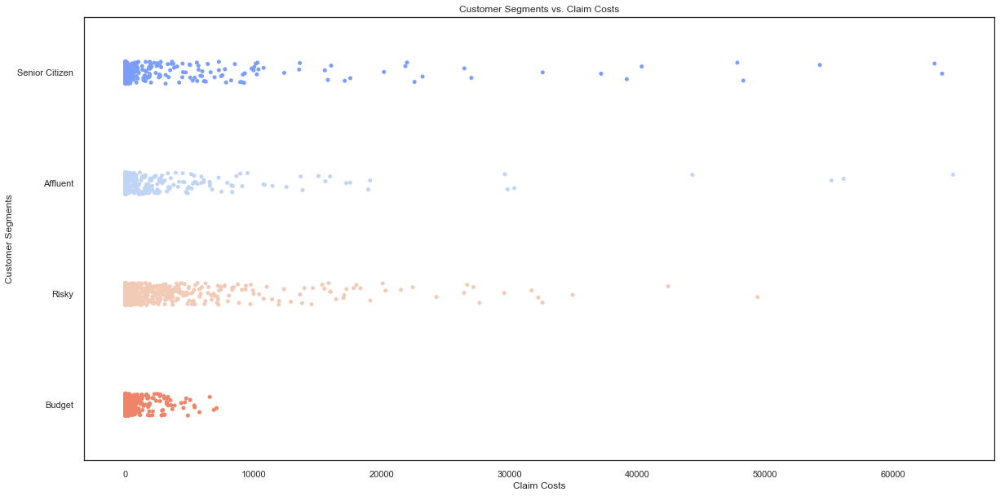

In [220]:
fig = plt.figure(figsize = (20,10))
sns.stripplot(data = finaldf, x = 'claimcst0', y = 'segmentation_label', palette = 'coolwarm')
plt.ylabel('Customer Segments')
plt.xlabel('Claim Costs')
plt.title('Customer Segments vs. Claim Costs');

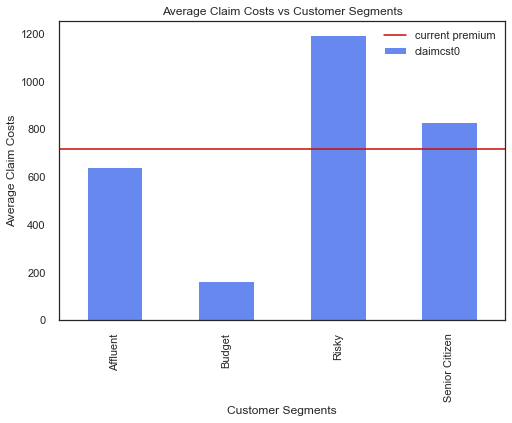

In [222]:
finaldf.groupby('segmentation_label')['claimcst0'].mean().plot(kind = 'bar')
plt.axhline(716, label="current premium", c = 'r')
plt.xlabel('Customer Segments')
plt.ylabel('Average Claim Costs')
plt.title('Average Claim Costs vs Customer Segments')
plt.legend();

We can see that both on average and on the aggregate, the 'Budget' Group is indeed the least risky in terms of claims costs. And the 'Risky' Group is indeed the most risky and brings the highest costs for the insurance company.

### 8.5 Business Value

Prior to having our model, the insurance company employed a single premium policy for all customers. This resulted in low-risk customers having to pay high premiums, likely leading to customer churn. While high-risk customers loved the policy, and could've even abused the system by driving more recklessly, likely leading to low profitability for the insurer.

With our model, not only can our insurer segment their customers based on risk, they can identify two additional customer profiles that give them the potential for more targeted marketing and premium policies.

For example, the insurer can:
1. Introduce cheaper and more standardized insurance policies for 'Budget' customers who are also low-risk. This will improve customer retention.
2. Introduce more expensive but more customized policies for 'Affluent' customers who may have a larger budget but requires better servicing. This will improve customer loyalty and revenues.
3. Introduce slightly higher premium policies for the 'Senior Citizens' since they have higher average claims, but provide more streamlined and personalized services to help them reduce stress. This is likely to improve customer satisfaction.
4. Introduce claims-dependent policies for 'Risky' and young customers, so that they would pay higher premiums the more often they are involved in an accident. This will increase revenues to cover the extra costs, and reduce the risky customers' moral hazard problem, and potentially saves lives!

<h2 style="background-color:DodgerBlue;color:white">9. Limitations

Our segmentation model has generated valuable business knowledge for the insurance company, and successfully separated customers into distinct customer/risk profiles. However, as we can see from the previous analysis and visualizations, our segmentation is far from being perfect. A limitation of our model is that it fails to capture all the 'outlier' (very high claims cost) customers into a single group. Whether this limitation is due to the nature of road accidents being unpredictable, or due to limited data (for example, there may be important features not included in the model) is worth further investigation.

<h2 style="background-color:DodgerBlue;color:white">10. Conclusion

In this project, we successfully built a customer profiling model for a motor insurance company. Through explorartory data analysis, feature selection and engineering, iterative model training and hyperparameter tuning, we have been able to first build a customer segmentation model that effectively divided customers into four groups of different customer/risk profiles. Further, we leveraged on the segmentation labels to train a supervised Logistic Regression, that predicts new customers' profiles with 99% accuracy. The insurer will be able to use the model to accurately predict new customer's risk profile and offer them a more appropriate and more targeted premium policy. This marks a significant improve from the insurer's benchmark policy and is likely to boost the business's profitability and customer satisfaction.